In [0]:
# reading gold_ml table
df = spark.table("creditrisk.gold_ml")
df.display()

person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_default_flag,cb_person_cred_hist_length,prior_default_high_risk_flag,loan_status
21,9600,5.0,1000,11.14,0.1,0,2,0,0
25,9600,1.0,5500,12.87,0.57,0,3,0,1
23,65500,4.0,35000,15.23,0.53,0,2,0,1
24,54400,8.0,35000,14.27,0.55,1,4,1,1
21,9900,2.0,2500,7.14,0.25,0,2,0,1
26,77100,8.0,35000,12.42,0.45,0,3,0,1
24,78956,5.0,35000,11.11,0.44,0,4,0,1
24,83000,8.0,35000,8.9,0.42,0,2,0,1
21,10000,6.0,1600,14.74,0.16,0,3,0,1
22,85000,6.0,35000,10.37,0.41,0,4,0,1


## Feature Vector Creation

In [0]:
# identifying the features
feature_cols = [
    "person_age",
    "person_income",
    "person_emp_length",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_default_flag",
    "cb_person_cred_hist_length",
    "prior_default_high_risk_flag"
]

In [0]:
from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(
    inputCols=feature_cols,
    outputCol="features"
)

df_vector = assembler.transform(df)


### Train Test Split

In [0]:
train_df, test_df = df_vector.randomSplit([0.8, 0.2], seed=42)

#### Model Creation - Logistic Regression

In [0]:
from pyspark.ml.classification import LogisticRegression

lr = LogisticRegression(
    featuresCol="features",
    labelCol="loan_status"
)

model = lr.fit(train_df)

### Model Evaluation

In [0]:
predictions = model.transform(test_df)
predictions.select("loan_status", "probability", "prediction").display()

loan_status,probability,prediction
0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.8208762856470365"",""0.17912371435296348""]}",0.0
0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.969870367782767"",""0.03012963221723297""]}",0.0
0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9583362007897093"",""0.04166379921029073""]}",0.0
0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9758436928411496"",""0.02415630715885042""]}",0.0
1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.5199579218797483"",""0.4800420781202517""]}",0.0
1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.11414474055222618"",""0.8858552594477738""]}",1.0
1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.7946835003431052"",""0.2053164996568948""]}",0.0
0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9000137489300218"",""0.09998625106997816""]}",0.0
1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.3530841001858779"",""0.6469158998141221""]}",1.0
1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.32697472885378714"",""0.6730252711462128""]}",1.0


**AUC**

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

evaluator = BinaryClassificationEvaluator(
    labelCol="loan_status",
    metricName="areaUnderROC"
)

auc = evaluator.evaluate(predictions)
print("AUC:", auc)

AUC: 0.8241664940205172


In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

accuracy = MulticlassClassificationEvaluator(
    labelCol="loan_status",
    predictionCol="prediction",
    metricName="accuracy"
).evaluate(predictions)

precision = MulticlassClassificationEvaluator(
    labelCol="loan_status",
    predictionCol="prediction",
    metricName="weightedPrecision"
).evaluate(predictions)

recall = MulticlassClassificationEvaluator(
    labelCol="loan_status",
    predictionCol="prediction",
    metricName="weightedRecall"
).evaluate(predictions)
print("AUC:", auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

AUC: 0.8241664940205172
Accuracy: 0.824934504546155
Precision: 0.8089145762169967
Recall: 0.824934504546155


In [0]:
from pyspark.sql.functions import col

tp = predictions.filter((col("loan_status")==1) & (col("prediction")==1)).count()
tn = predictions.filter((col("loan_status")==0) & (col("prediction")==0)).count()
fp = predictions.filter((col("loan_status")==0) & (col("prediction")==1)).count()
fn = predictions.filter((col("loan_status")==1) & (col("prediction")==0)).count()

accuracy_manual = (tp + tn) / (tp + tn + fp + fn)
precision_manual = tp / (tp + fp) if (tp + fp) > 0 else 0
recall_manual = tp / (tp + fn) if (tp + fn) > 0 else 0

print("AUC:", auc)
print("Accuracy:", accuracy_manual)
print("Precision:", precision_manual)
print("Recall:", recall_manual)
print("True Positive:", tp)
print("True Negative:",tn)
print("False Positive:", fp)
print("False Negative:", fn)

AUC: 0.8241664940205172
Accuracy: 0.824934504546155
Precision: 0.6731470230862697
Recall: 0.38986629134412387
True Positive: 554
True Negative: 4799
False Positive: 269
False Negative: 867


### ML Flow Logging

In [0]:
import mlflow
import mlflow.spark
import os
os.environ["MLFLOW_DFS_TMP"] = "/Volumes/workspace/creditrisk/creditrisk_data"


with mlflow.start_run(run_name="credit_risk_logistic_regression"):
    
    mlflow.log_param("model_type", "LogisticRegression")
    mlflow.log_param("features", ",".join(feature_cols))
    mlflow.log_metrics({"AUC": auc, "precision": precision_manual,"recall": recall_manual, "accuracy": accuracy_manual})
    mlflow.spark.log_model(model, "credit_risk_model")

2026/02/01 11:58:41 WARNING mlflow.utils.requirements_utils: Found pyspark version (4.0.0+databricks.connect.17.2.2) contains a local version label (+databricks.connect.17.2.2). MLflow logged a pip requirement for this package as 'pyspark==4.0.0' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2026/02/01 11:58:45 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /local_disk0/user_tmp_data/spark-5fe303b8-9f45-4509-9923-64/tmpedqzlwj6/model, flavor: spark). Fall back to return ['pyspark==4.0.0']. Set logging level to DEBUG to see the full traceback. 
2026/02/01 11:58:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


In [0]:
coeff_df = spark.createDataFrame(
    zip(feature_cols, [float(x) for x in model.coefficients]),
    ["feature", "coefficient"]
)

coeff_df.orderBy("coefficient", ascending=False).display()

feature,coefficient
loan_percent_income,11.955482569489691
loan_int_rate,0.3164983180374181
cb_default_flag,0.03698993206072425
person_age,0.0072592747774961565
person_income,4.1914365637731936E-7
loan_amnt,-9.412987838666925E-5
cb_person_cred_hist_length,-0.008780536172728285
person_emp_length,-0.024714624091627113
prior_default_high_risk_flag,-0.4247964408269563


In [0]:
predictions.select("loan_status", "prediction").display()

loan_status,prediction
0,0.0
0,0.0
0,0.0
0,0.0
1,0.0
1,1.0
1,0.0
0,0.0
1,1.0
1,1.0


**creating confusion**

In [0]:
from pyspark.sql.functions import col

confusion_matrix = (
    predictions
    .groupBy("loan_status", "prediction")
    .count()
    .orderBy("loan_status", "prediction")
)

confusion_matrix.display()

loan_status,prediction,count
0,0.0,4799
0,1.0,269
1,0.0,867
1,1.0,554


In [0]:
predictions.write.format("delta").mode("overwrite").saveAsTable("creditrisk.creditrisk_predictions")

In [0]:
%sql
select loan_status,prediction, count(prediction)
from creditrisk.creditrisk_predictions
GROUP BY loan_status, prediction;

loan_status,prediction,count(prediction)
0,0.0,4799
1,0.0,867
1,1.0,554
0,1.0,269


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
SELECT loan_percent_income,prior_default_high_risk_flag
FROM creditrisk.gold_analytics
GROUP BY prior_default_high_risk_flag,loan_percent_income

loan_percent_income,prior_default_high_risk_flag
0.1,0
0.57,0
0.53,0
0.55,1
0.25,0
0.45,0
0.44,0
0.42,0
0.16,0
0.41,0


Databricks visualization. Run in Databricks to view.

In [0]:
from pyspark.ml.functions import vector_to_array
from pyspark.sql.functions import col

pdf = (
    predictions
    .withColumn("prob_array", vector_to_array(col("probability")))
    .withColumn("default_prob", col("prob_array")[1])
    .select("loan_status", "default_prob")
    .toPandas()
)
# pdf[["loan_status", "prediction","default_prob"]].display()

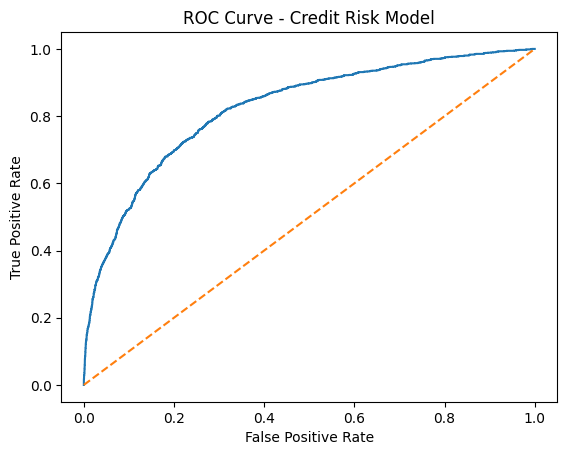

In [0]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(
    pdf["loan_status"],
    pdf["default_prob"]
)

plt.figure()
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Credit Risk Model")
plt.show()


In [0]:
from pyspark.sql.functions import when
pdf_1 = (
    predictions
    .withColumn("prob_array", vector_to_array(col("probability")))
    .withColumn("default_prob", col("prob_array")[1]))
scored_df = pdf_1.withColumn(
    "decision",
    when(col("default_prob") < 0.3, "APPROVE")
    .when(col("default_prob") < 0.6, "REVIEW")
    .otherwise("REJECT")
)

final_predictions = scored_df.select(
    "loan_status",
    "default_prob",
    "prediction",
    "decision"
)
final_predictions.write.format("delta") \
    .mode("overwrite") \
    .saveAsTable("creditrisk.gold_loan_predictions")


In [0]:
final_predictions.display()

loan_status,default_prob,prediction,decision
0,0.17912371435296348,0.0,APPROVE
0,0.03012963221723297,0.0,APPROVE
0,0.04166379921029073,0.0,APPROVE
0,0.02415630715885042,0.0,APPROVE
1,0.4800420781202517,0.0,REVIEW
1,0.8858552594477738,1.0,REJECT
1,0.2053164996568948,0.0,APPROVE
0,0.09998625106997816,0.0,APPROVE
1,0.6469158998141221,1.0,REJECT
1,0.6730252711462128,1.0,REJECT


In [0]:
predictions.display()

person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_default_flag,cb_person_cred_hist_length,prior_default_high_risk_flag,loan_status,features,rawPrediction,probability,prediction
20,42000,4.0,6500,11.71,0.15,0,2,0,0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""20.0"",""42000.0"",""4.0"",""6500.0"",""11.71"",""0.15"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""1.5222957019518777"",""-1.5222957019518777""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.8208762856470365"",""0.17912371435296348""]}",0.0
20,77000,4.0,6000,8.0,0.08,0,2,0,0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""20.0"",""77000.0"",""4.0"",""6000.0"",""8.0"",""0.08"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""3.471653274568437"",""-3.471653274568437""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.969870367782767"",""0.03012963221723297""]}",0.0
20,85920,3.0,12000,8.49,0.14,0,2,0,0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""20.0"",""85920.0"",""3.0"",""12000.0"",""8.49"",""0.14"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""3.1355660293742234"",""-3.1355660293742234""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9583362007897093"",""0.04166379921029073""]}",0.0
20,188004,4.0,2000,8.59,0.01,0,2,0,0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""20.0"",""188004.0"",""4.0"",""2000.0"",""8.59"",""0.01"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""3.698756910811454"",""-3.698756910811454""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9758436928411496"",""0.02415630715885042""]}",0.0
21,8000,1.0,2800,7.4,0.35,0,2,0,1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""8000.0"",""1.0"",""2800.0"",""7.4"",""0.35"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.07987412602898747"",""-0.07987412602898747""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.5199579218797483"",""0.4800420781202517""]}",0.0
21,9000,4.0,3000,15.23,0.33,0,4,0,1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""9000.0"",""4.0"",""3000.0"",""15.23"",""0.33"",""0.0"",""4.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-2.0490862761729076"",""2.0490862761729076""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.11414474055222618"",""0.8858552594477738""]}",1.0
21,9900,2.0,2500,7.14,0.25,0,2,0,1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""9900.0"",""2.0"",""2500.0"",""7.14"",""0.25"",""0.0"",""2.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""1.3533912332961942"",""-1.3533912332961942""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.7946835003431052"",""0.2053164996568948""]}",0.0
21,10560,5.0,1000,10.36,0.09,0,4,0,0,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""10560.0"",""5.0"",""1000.0"",""10.36"",""0.09"",""0.0"",""4.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""2.197377352561184"",""-2.197377352561184""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.9000137489300218"",""0.09998625106997816""]}",0.0
21,12000,0.0,4000,10.65,0.33,0,4,0,1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""12000.0"",""0.0"",""4000.0"",""10.65"",""0.33"",""0.0"",""4.0"",""0.0""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""-0.6055100285105048"",""0.6055100285105048""]}","{""type"":""1"",""size"":null,""indices"":null,""values"":[""0.3530841001858779"",""0.6469158998141221""]}",1.0
21,12000,0.0,4000,10.99,0.33,0,3,0,1,"{""type"":""1"",""size"":null,""indices"":null,""values"":[""21.0"",""12000.0"",""0.0"",""4000.0"",""10.99

In [0]:
%sql
SELECT decision,
       COUNT(*) AS total_loans,
       ROUND(AVG(loan_status), 3) AS actual_default_rate
FROM creditrisk.gold_loan_predictions
GROUP BY decision;


decision,total_loans,actual_default_rate
APPROVE,4790,0.107
REVIEW,1151,0.424
REJECT,548,0.765
